In [27]:
import os
import sys

import librosa
import librosa.display
import pandas as pd
import numpy as np
import IPython.display as ipd
import matplotlib.pyplot as plt

In [28]:
sys.path.append("..")
%matplotlib inline

In [29]:
try:
    from app.config import DATA_DIR
except ModuleNotFoundError:
    from app.config import DATA_DIR

In [44]:
f_in_path = os.path.join(DATA_DIR,  "REMINDER_20200130-080006_VDAD_0933521045_698149-in.wav")
f_out_path = os.path.join(DATA_DIR, "REMINDER_20200130-080006_VDAD_0933521045_698149-out.wav")

In [45]:
path = "/home/dima/Projects/vtt_vn/misc/audio_data_preparation/test400_wav/converted/"

f_in_path = path + "/PILOT_20200206-202918_VDAD_0937129436_1240489-in.wav"
f_out_path = path + "/PILOT_20200206-202918_VDAD_0937129436_1240489-out.wav"

In [46]:
f_in_samples, f_in_sr  = librosa.load(f_in_path)
f_in_spectrum = librosa.amplitude_to_db(np.abs(librosa.stft(f_in_samples)), ref=np.max)

In [47]:
ipd.Audio(f_in_samples, rate=f_in_sr)

In [48]:
f_out_samples, f_out_sr  = librosa.load(f_out_path)
f_out_spectrum = librosa.amplitude_to_db(np.abs(librosa.stft(f_out_samples)), ref=np.max)
# pri|nt(f_out_sr)
# print(f_out_samples)
# print(f_out_spectrum)

In [49]:
ipd.Audio(f_out_samples, rate=f_out_sr)

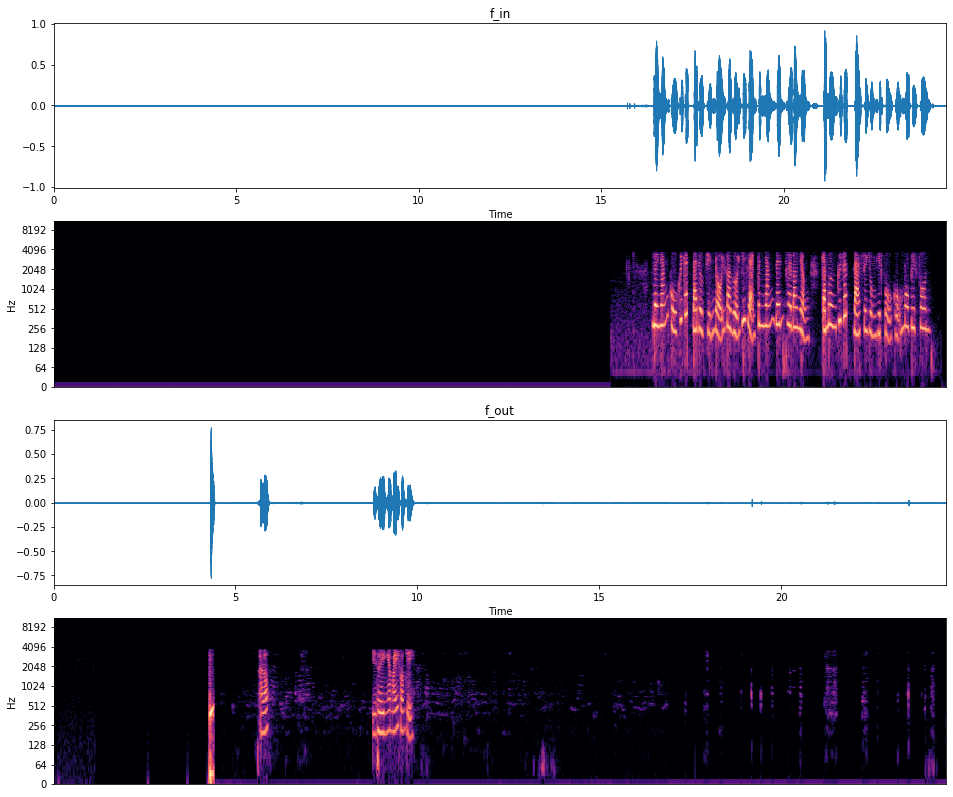

In [50]:
plt.figure(figsize=(16, 14))
plt.subplot(4, 1, 1)
librosa.display.waveplot(f_in_samples, sr=f_in_sr)
plt.title('f_in')
plt.subplot(4, 1, 2)
librosa.display.specshow(f_in_spectrum, y_axis='log')
# plt.colorbar(format='%+2.0f dB')
plt.subplot(4, 1, 3)
librosa.display.waveplot(f_out_samples, sr=f_out_sr)
plt.title('f_out')
plt.subplot(4, 1, 4)
librosa.display.specshow(f_out_spectrum, y_axis='log');
# plt.colorbar(format='%+2.0f dB')

### Silence splitting by batch averaging

In [36]:
class SilenceSplitter:
    """
    Utility class that allows to split audio record by silence and get appropriate timestamps.
    Uses librosa and numpy libraries.

    Parameters
    ----------
    path : str
        path to audio path
    sample_threshold : float, default 0.3
        sample threshold that defines whether sample is silence or not
    silence_threshold : float, default 0.5
        defines minimum time in seconds between 2 audio batches when we can merge them into 1
    batch_duration : float, default 0.25
        multiplicity of timestamp
    """

    def __init__(self, path,
                 sample_threshold=0.3,
                 silence_threshold=0.5,
                 batch_duration=0.25):

        self.path = path
        self.sample_threshold = sample_threshold
        self.silence_threshold = silence_threshold
        self.batch_duration = batch_duration
        self.samples, self.sample_rate = librosa.load(self.path)
        self.batch_size = int(self.sample_rate * self.batch_duration)
        self.duration = round(librosa.get_duration(self.samples, self.sample_rate))
        self.batch_num = int(self.duration / self.batch_duration)

        self.new_samples = np.array([])
        self.sample_batches = []
        self.sample_states = []
        self.sample_timestamps = []
        self.sample_timestamps_merged = []

    def __make_batches(self):
        """
        Forms batches from original samples
        """
        self.sample_batches = np.array([
            self.samples[i * self.batch_size: (i + 1) * self.batch_size]
            for i in range(self.batch_num)
        ])
        return self

    def __make_states(self):
        """
        Defines whether batch belongs to silence or not
        """
        self.sample_states = [
            (index * self.batch_duration, 1)
            if np.max(batch) > self.sample_threshold
            else
            (index * self.batch_duration, 0)
            for index, batch in enumerate(self.sample_batches, 1)
        ]
        return self

    def __make_timestamps(self):
        """
        Filtering batches with silence, leaving only batches in accordance with ``silence_threshold``
        """
        batch_start, batch_stop = 0, 0

        for i in range(len(self.sample_states) - 1):
            window = self.sample_states[i:i + 2]

            if window[0][1] == 0 and window[1][1] == 1:
                batch_start = window[0][0]
            elif window[0][1] == 1 and window[1][1] == 0:
                batch_stop = window[1][0]

            if batch_stop - batch_start > self.silence_threshold:
                self.sample_timestamps.append((batch_start, batch_stop))
            else:
                continue
        return self

    def __merge_close_timestamps(self):
        """
        Merging close batches in accordance with ``silence_threshold``
        """
        tmp = self.sample_timestamps.copy()
        ts_len = len(tmp)

        for i in range(0, ts_len - 1, 1):
            x, y = tmp[i], tmp[i + 1]
            extended_ts = (x[0], y[1])
            ts_dif = y[0] - x[1]

            if i == ts_len - 2:
                if ts_dif <= self.silence_threshold:
                    self.sample_timestamps_merged.append(extended_ts)
                else:
                    self.sample_timestamps_merged.append(x)
                    self.sample_timestamps_merged.append(y)
            else:
                if ts_dif <= self.silence_threshold:
                    tmp[i + 1] = extended_ts
                else:
                    self.sample_timestamps_merged.append(x)
        return self

    def sample_silence_split(self, merge_close=True, inplace=False):
        """
        Run the whole splitting pipeline

        Parameters
        ----------
        merge_close : bool, default True
            define to use merging close to each other batches
        inplace : bool, default False
            apply method inplace

        Returns
        -------
        res : list
            list of tuples that contain timestamps
        """
        self.__make_batches()
        self.__make_states()
        self.__make_timestamps()
        
        if merge_close:
            self.__merge_close_timestamps()
            res = self.sample_timestamps_merged
        else:
            res = self.sample_timestamps
            
        if inplace:
            return self
        else:
            return res
    
    def sample_silence_concat(self, inplace=False):
        timestamps = self.sample_timestamps_merged if len(self.sample_timestamps_merged) > 0 \
                                                   else self.sample_timestamps
        for ts in timestamps:
            tmp = self.samples[int(ts[0]*self.sample_rate):int(ts[1]*self.sample_rate)]
            self.new_samples = np.append(self.new_samples, tmp)
        
        if inplace:
            return self
        else:
            return self.new_samples
        
    def save_wav(self, path):
        if len(self.new_samples) > 0:
            librosa.output.write_wav(path, self.new_samples, self.sample_rate)
            return self
        else:
            raise ValueError

In [37]:
f_in_sample_timestamps = SilenceSplitter(path=f_in_path).sample_silence_split()
f_out_sample_timestamps = SilenceSplitter(path=f_out_path).sample_silence_split()

ValueError: zero-size array to reduction operation maximum which has no identity

### Plot the results

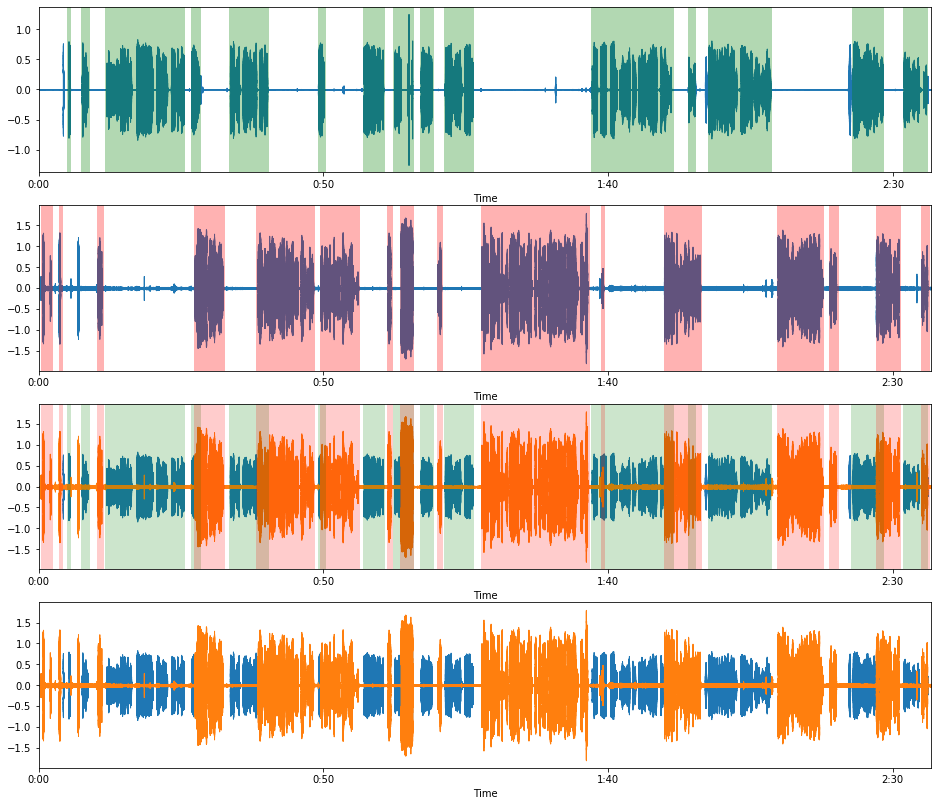

In [12]:
plt.figure(figsize=(16, 14))

plt.subplot(4, 1, 1)
librosa.display.waveplot(f_out_samples, sr=f_out_sr)
for item in f_out_sample_timestamps:
    plt.axvspan(item[0], item[1], facecolor='green', alpha=0.3)
# plt.title('f_out');

plt.subplot(4, 1, 2)
librosa.display.waveplot(f_in_samples, sr=f_in_sr)
for item in f_in_sample_timestamps:
    plt.axvspan(item[0], item[1], facecolor='red', alpha=0.3)
# plt.title('f_in');

plt.subplot(4, 1, 3)
librosa.display.waveplot(f_out_samples, sr=f_out_sr)
for item in f_out_sample_timestamps:
    plt.axvspan(item[0], item[1], facecolor='green', alpha=0.2)
librosa.display.waveplot(f_in_samples, sr=f_in_sr)
for item in f_in_sample_timestamps:
    plt.axvspan(item[0], item[1], facecolor='red', alpha=0.2)
    
plt.subplot(4, 1, 4)
librosa.display.waveplot(f_out_samples, sr=f_out_sr)
librosa.display.waveplot(f_in_samples, sr=f_in_sr);

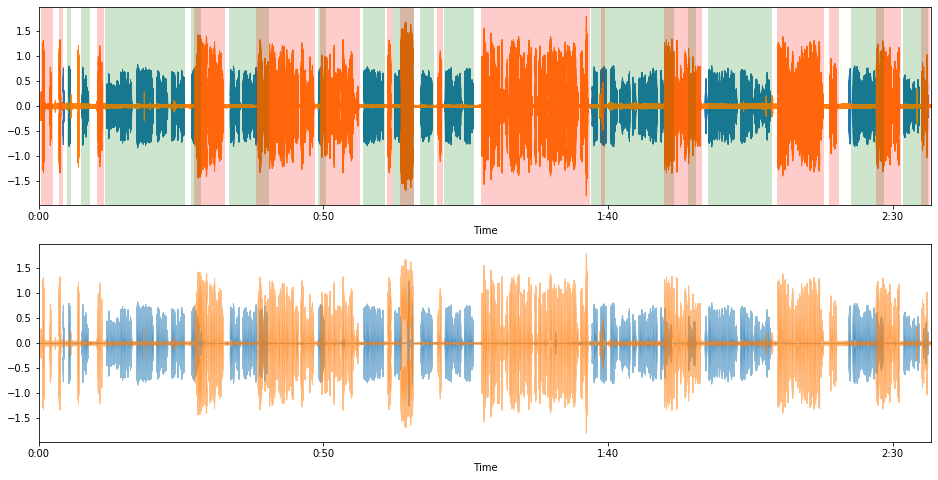

In [13]:
plt.figure(figsize=(16, 8))

plt.subplot(2, 1, 1)
librosa.display.waveplot(f_out_samples, sr=f_out_sr)
for item in f_out_sample_timestamps:
    plt.axvspan(item[0], item[1], facecolor='green', alpha=0.2)
librosa.display.waveplot(f_in_samples, sr=f_in_sr)
for item in f_in_sample_timestamps:
    plt.axvspan(item[0], item[1], facecolor='red', alpha=0.2)
    
plt.subplot(2, 1, 2)
librosa.display.waveplot(f_out_samples, sr=f_out_sr, alpha=0.5)
librosa.display.waveplot(f_in_samples, sr=f_in_sr, alpha=0.5);

In [14]:
ipd.Audio(f_out_samples, rate=f_out_sr)

In [ ]:
ss = SilenceSplitter(path=f_in_path)
ss.sample_silence_split(inplace=True).sample_silence_concat(inplace=True)#.save_wav('test_file.wav');

In [26]:
ipd.Audio(ss.new_samples, rate=ss.sample_rate)